# Librerías e importar data set

In [ ]:
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from dateutil.parser import parse

!pip install pandas-profiling --upgrade
from ydata_profiling import ProfileReport

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 KB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 344.5/344.5 KB 24.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 KB 41.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 72.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 66.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 KB 26.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=0da05ba960ceeaed8dff3616ca93ecd266f052908c954b4d6c615a86f8658781
  Stored in directory: /root/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
Successfully built htmlmin
  Attempti

In [ ]:
#Leer datasets
artists_df = pd.read_csv("/content/artists_mod.csv")
tracks_df = pd.read_csv("/content/tracks_mod.csv")

# Descripción general data set Tracks

In [ ]:
ProfileReport(tracks_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
tracks_df.dtypes

id                   object
name                 object
popularity          float64
duration_ms           int64
explicit              int64
artists              object
id_artists           object
release_date         object
danceability        float64
energy              float64
key                 float64
loudness            float64
mode                float64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
time_signature      float64
dtype: object

# Calidad y liempieza de los datos

In [ ]:
#Eliminar filas con nombres de canción vacíos
tracks_df = tracks_df.dropna(subset=['name']) 

In [ ]:
#Busca las fechas que tienen formato "year xxxx"
pos = tracks_df[["release_date"]][tracks_df[["release_date"]].release_date.str.contains('Year')].index

In [ ]:
#reemplaza fechas con formato "year xxxx" con el año
for i in pos:
  tracks_df.loc[i,'release_date'] = str(tracks_df.loc[i,'release_date'][-4:])

In [ ]:
# Unificar formato de fechas
from datetime import datetime
from dateutil.parser import parse
import datetime

fechas = tracks_df["release_date"]

formatos = ['%Y-%m-%d','%Y-%m', '%Y/%m/%d','%Y-%Y']

# Lista de formatos comunes
formato_comun = '%Y'

# Convertir todas las fechas a un formato común
fechas_unificadas = []
for fecha in fechas:
    try:
        fecha_datetime = datetime.datetime.strptime(fecha, formato_comun)
        fechas_unificadas.append(fecha_datetime.year)
    except ValueError:
        fecha_datetime = parse(fecha)
        fechas_unificadas.append(fecha_datetime.year)

In [ ]:
tracks_df['release_date'] = fechas_unificadas

In [ ]:
tracks_df.dtypes

id                   object
name                 object
popularity          float64
duration_ms         float64
explicit              int64
artists              object
id_artists           object
release_date          int64
danceability        float64
energy              float64
key                 float64
loudness            float64
mode                float64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
time_signature      float64
dtype: object

In [ ]:
#se convierte la duración de las canciones de milisegundos a minutos
tracks_df["duration_ms"] = tracks_df["duration_ms"]/60000

In [ ]:
#Se cambia el nombre de la columna duration_ms a duration_min
tracks_df = tracks_df.rename(columns={'duration_ms': 'duration_min'})

In [ ]:
#Se reemplazan los valores vacíos de ciertas variables por su media 
mean_popularity = tracks_df["popularity"].mean()         
tracks_df["popularity"] = tracks_df["popularity"].fillna(mean_popularity)
tracks_df["popularity"] = tracks_df["popularity"].astype(int)

mean_danc = tracks_df["danceability"].mean()         
tracks_df["danceability"] = tracks_df["danceability"].fillna(mean_danc)

mean_energy = tracks_df["energy"].mean()        
tracks_df["energy"] = tracks_df["energy"].fillna(mean_energy)

mean_key = tracks_df["key"].mean()        
tracks_df["key"] = tracks_df["key"].fillna(mean_key)

mean_loudness = tracks_df["loudness"].mean()        
tracks_df["loudness"] = tracks_df["loudness"].fillna(mean_loudness)

mean_speech = tracks_df["speechiness"].mean()        
tracks_df["speechiness"] = tracks_df["speechiness"].fillna(mean_speech)

mean_acous = tracks_df["acousticness"].mean()        
tracks_df["acousticness"] = tracks_df["acousticness"].fillna(mean_acous)

mean_instr = tracks_df["instrumentalness"].mean()        
tracks_df["instrumentalness"] = tracks_df["instrumentalness"].fillna(mean_instr)

mean_live = tracks_df["liveness"].mean()        
tracks_df["liveness"] = tracks_df["liveness"].fillna(mean_live)

mean_val = tracks_df["valence"].mean()        
tracks_df["valence"] = tracks_df["valence"].fillna(mean_val)

mean_tempo = tracks_df["tempo"].mean()        
tracks_df["tempo"] = tracks_df["tempo"].fillna(mean_tempo)

Valores Atípicos

[]

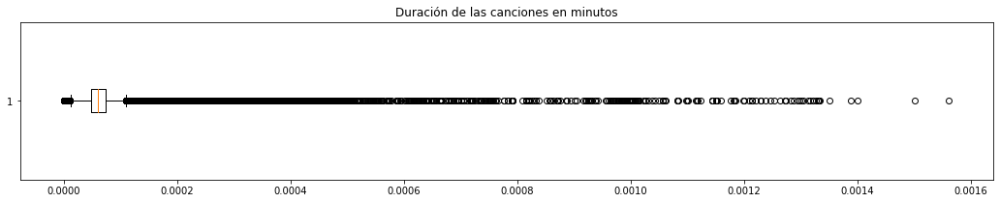

In [ ]:
#boxplot duration_min 
plt.figure(figsize = (18, 3))
plt.boxplot(tracks_df['duration_min'], vert = False)
plt.title("Duración de las canciones en minutos")
plt.plot()

In [ ]:
#prueba de normalidad para la duración de las canciones
import seaborn as sns
from scipy.stats import shapiro

stat, p = shapiro(tracks_df["duration_min"])
print("Stat:", stat)
print("p-value:", p)


Stat: 0.5869759917259216
p-value: 0.0


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Text(0.5, 1.0, 'Histograma duración de las canciones en minutos')

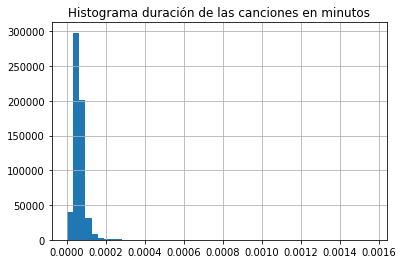

In [ ]:
#Histrograma duración de las canciones
plt.figure()
tracks_df['duration_min'].hist(bins = 50)
plt.title("Histograma duración de las canciones en minutos")

In [ ]:
#Canciones con duraciones atípicas
tracks_df[tracks_df['duration_min'] > (tracks_df['duration_min'].mean() + tracks_df['duration_min'].std() * 7)]

,id,name,popularity,duration_min,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
1127,2Pu2Hv2NnitI7yxc3rHQzf,Death and Transfiguration,0,0.000371,0,"['Richard Strauss', 'Karl Böhm', 'Staatskapell...","['6pAwHPeExeUbMd5w7Iny6D', '3fyr5uksidSlLzsUjR...",1924,0.1080,0.183,7.0,-16.348,1.0,0.0348,0.972,0.901000,0.107000,0.0369,91.171,3.0
5408,6pRh92RIJ9I4o1IZo9JCqo,Tod und Verklärung Op. 24,0,0.000403,0,"['Richard Strauss', 'London Philharmonic Orche...","['6pAwHPeExeUbMd5w7Iny6D', '3PfJE6ebCbCHeuqO4B...",1929,0.0965,0.129,7.0,-16.723,1.0,0.0375,0.959,0.933000,0.089700,0.0338,76.544,3.0
5525,6Zy82cYdN3x9ktUpQxHydk,"Piano Sonata in B Minor, S. 178",15,0.000501,0,"['Franz Liszt', 'Vladimir Horowitz']","['1385hLNbrnbCJGokfH2ac2', '4Ws5hSoABAwvGJ4LhH...",1930,0.3100,0.220,6.0,-16.664,NaN,0.0428,0.979,0.868000,0.162000,0.0634,79.903,4.0
6596,0bIuxZqqFor0FWIexwWjqh,N'ecoutez Pas Mesdames,0,0.000516,0,['Sacha Guitry'],['5WxFNZUj28Pvf9fsOivG5F'],1931,0.5220,0.240,8.0,-25.380,1.0,0.8610,0.766,0.000000,0.106000,0.3560,77.297,4.0
8025,7M2tLKFG4LJEx0rd0NqFAu,Anslag,0,0.000859,0,['Portugallien'],['18LbUxlDiDSNFm1HREKWqL'],1932,0.0644,0.132,3.0,-37.943,1.0,0.0583,0.993,0.962000,0.144000,0.0357,72.482,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586241,1eiEgIsNaFr1odj9WXBp7J,The Butterfly Lovers Violin Concerto,28,0.000439,0,"['Gang Chen', 'Zhanhao He', 'Si-Qing Lu', 'Sha...","['5GUhei8a6yiqmS1w2GX9Bt', '1h8qGgafncr0kIhF04...",1997,0.2090,0.110,2.0,-19.068,1.0,0.0448,0.849,0.515000,0.213929,0.0931,94.911,3.0
586255,0l26gUyiW2mLs8snitCfN3,地藏王菩薩超度心咒 - 梵唱篇 藏音修行版 深入經藏 智慧如海 可超拔靈障免災難得延壽,18,0.000471,0,"['羅天洲', '蕭蔓萱']","['47q0BWzvk0IEP0CiDhOecH', '7hbDZWvH2gxvCuwBgg...",1998,0.4010,0.457,11.0,-10.417,0.0,0.0291,0.194,0.000008,0.073200,0.3480,179.924,4.0
586270,6I3XHbjymdlBzE5LPw3bhi,南無地藏王菩薩聖號 - 深入經藏 智慧如海 我不入地獄誰入地獄 地獄不空誓不成佛,19,0.000457,0,"['小楊', '羅天洲', '蕭蔓萱']","['2lJXUwKiCMrW4W7gldhcEm', '47q0BWzvk0IEP0CiDh...",1999,0.1950,0.260,0.0,-13.648,1.0,0.0339,0.340,0.000000,0.107000,0.2010,94.207,3.0
586351,2lISa7eUuRA5Zcu9X9IUHh,バレエ音楽「ガイーヌ」より,2,0.000398,0,"['アラム・イリイチ・ ハチャトゥリアン', '吹奏楽団Festa']","['0fLXs20ZdoEIbYVTNPawfm', '0knh2d8bPEHmF4KlQr...",2005,0.2540,0.321,3.0,-12.630,1.0,0.0400,0.822,0.844000,0.596000,0.0803,87.832,4.0


In [ ]:
#Convirtiendo variable speechiness a categórica 1 a 0.66 (alto sp), 0.66 a 0.33 (medio sp) y 0.33 a 0 (bajo sp)
datos = tracks_df["speechiness"]
nuevos = []
for i in datos:
  if i >= 0.66:
    nuevos.append("Alto SP") 
  elif i >= 0.33:
    nuevos.append("Medio SP")
  else:
    nuevos.append("Bajo SP")


In [ ]:
tracks_df["speechiness"] = nuevos

In [ ]:
tracks_df.head(10)

,id,name,popularity,duration_min,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,0.000035,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922,0.645,0.445000,0.0,-13.338,1.0,Medio SP,0.674,0.744000,0.151000,0.127000,104.851,3.0
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,0.000027,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922,0.695,0.263000,0.0,-22.136,1.0,Alto SP,0.797,0.000000,0.148000,0.655000,102.009,1.0
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,0.000050,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922,0.434,0.177000,1.0,-21.180,1.0,Bajo SP,0.994,0.021800,0.212000,0.457000,130.418,5.0
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,27,0.000049,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922,0.321,0.542195,7.0,-27.961,1.0,Bajo SP,0.995,0.918000,0.104000,0.397000,169.980,3.0
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,0.000045,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.158000,3.0,-16.900,0.0,Bajo SP,0.989,0.130000,0.311000,0.196000,103.220,4.0
5,0BRXJHRNGQ3W4v9frnSfhu,Ave Maria,0,0.000050,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.227,0.261000,5.0,-12.343,1.0,Bajo SP,0.994,0.247000,0.097700,0.053900,118.891,4.0
6,0Dd9ImXtAtGwsmsAD69KZT,La Butte Rouge,0,0.000037,0,['Francis Marty'],['2nuMRGzeJ5jJEKlfS7rZ0W'],1922,0.510,0.355000,4.0,-12.833,1.0,Bajo SP,0.965,0.000000,0.155000,0.727000,85.754,5.0
7,0IA0Hju8CAgYfV1hwhidBH,La Java,0,0.000045,0,['Mistinguett'],['4AxgXfD7ISvJSTObqm4aIE'],1922,0.563,0.184000,4.0,-13.757,1.0,Bajo SP,0.993,0.113325,0.325000,0.654000,133.088,NaN
8,0IgI1UCz84pYeVetnl1lGP,Old Fashioned Girl,0,0.000086,0,['Greg Fieler'],['5nWlsH5RDgFuRAiDeOFVmf'],1922,0.488,0.475000,0.0,-16.222,0.0,Bajo SP,0.620,0.006450,0.213929,0.544000,139.952,4.0
9,0JV4iqw2lSKJaHBQZ0e5zK,Martín Fierro - Remasterizado,0,0.000050,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922,0.548,0.039100,6.0,-23.228,1.0,Bajo SP,0.996,0.113325,0.148000,0.552275,75.595,3.0


In [ ]:
tracks_v1 = tracks_df

# Análisis Exploratorio de datos

In [ ]:
#Se revisan las variables con alerta de alta correlación en el perfilamiento
tracks_df[['danceability', 'valence']].corr("spearman")

,danceability,valence
danceability,1.000000,0.485394
valence,0.485394,1.000000


In [ ]:
tracks_df[['energy', 'loudness']].corr("spearman")

,energy,loudness
energy,1.000000,0.738641
loudness,0.738641,1.000000


In [ ]:
tracks_df[['energy', 'acousticness']].corr("spearman")

,energy,acousticness
energy,1.000000,-0.689175
acousticness,-0.689175,1.000000


In [ ]:
tracks_df[['loudness', 'acousticness']].corr("spearman")

,loudness,acousticness
loudness,1.000000,-0.507131
acousticness,-0.507131,1.000000


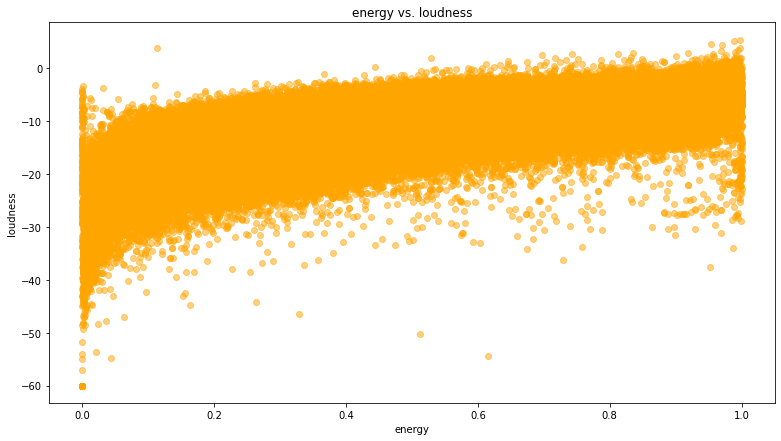

In [ ]:
plt.figure(figsize = (13, 7))
plt.scatter(tracks_df['energy'], tracks_df['loudness'], alpha = 0.5, color = 'orange')
plt.title('energy vs. loudness')
plt.xlabel('energy')
plt.ylabel('loudness')
plt.show()